In [1]:
from feature_module_F import *
from data_module_F import *
from ImgModule import *
from Un_Module import *

2025-03-18 14:27:55.165577: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-12.8/lib64:
2025-03-18 14:27:55.165644: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


2.7.0
2.7.0


/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.8.0 and strictly below 2.11.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.7.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [2]:
import time 
import psutil
import os
import random
import multiprocessing

import pandas as pd
import numpy as np
import scipy

import faiss

import rasterio

In [3]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from patsy import dmatrices ## patsy 0.5.3

from sklearn.preprocessing import RobustScaler,PowerTransformer, QuantileTransformer, MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error,mean_pinball_loss, d2_pinball_score, r2_score, explained_variance_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import QuantileRegressor

from pickle import dump,load


In [4]:

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

from scipy.stats import gaussian_kde

In [5]:
def limit_cpu_cores(process, num_cores):
    # Get the total number of available CPU cores
    total_cores = psutil.cpu_count()

    # Ensure num_cores does not exceed the total number of cores
    num_cores = min(num_cores, total_cores)
    rd = random.randint(1,total_cores
                       )
    # Get the process object
    process = psutil.Process(process.pid)

    # Set the CPU affinity to the first num_cores cores
    process.cpu_affinity(list(range(rd, rd + num_cores)))


# Get the current process ID
current_process = psutil.Process(os.getpid())

# Specify the number of CPU cores you want to use (replace with the desired number)
desired_num_cores = 5

# Limit the CPU cores usage of the current process
limit_cpu_cores(current_process, desired_num_cores)

## Data

In [6]:
tr_path = './Data/TrainingSpectra_1522.csv'

data_tr = pd.read_csv(tr_path).drop(['Unnamed: 0'], axis=1)
# meta = data_tr.loc[:,:'Longitude']

In [7]:
path = './distances/DisQuTraining_50neighFaiss_SpLastlayQuNorWithResiduals.csv'
dis_err = pd.read_csv(path)#.drop(['Unnamed: 0'], axis=1)

dis_err_val = dis_err.sample(int(dis_err.shape[0]*0.2), random_state=15)
dis_err_tr = dis_err.drop(dis_err_val.index, axis=0)

In [8]:
# dis_err_val_meta = meta.iloc[dis_err_val.index,:]
# dis_err_val_meta

array([[<Axes: title={'center': 'qu50_dist_EmbLCos_nor'}>,
        <Axes: title={'center': 'qu50_dist_SpCos_nor'}>]], dtype=object)

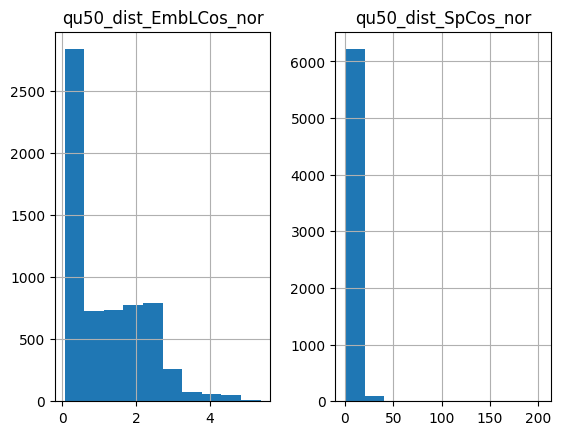

In [9]:
plt.rc('font', size=10)

subset = ['qu50_dist_EmbLCos_nor',
'qu50_dist_SpCos_nor']

dis_err_tr.loc[:, subset].hist()


## 95-QURegression modelling + evaluation 

### Training the models

#### Training Dis_UN models

In [ ]:
########### Uncetainty training 
# model_Un_training(dis_err_tr, subset, ls_tr, x_trans=True, save=True, path_model_tr='./Un_models_95QuReg')


### validating the model

In [ ]:
subset = ['qu50_dist_EmbLCos_nor',
'qu50_dist_SpCos_nor']

path_model_tr = './test_moUn_models_95QuRegdels/'
quantile = 0.95
list_tr = [0, 1, 2, 4, 5, 6]  # List of indices


In [14]:
un_pred_ts = []
for tr in list_tr:
    rescaled_y_pred = apply_model(tr, path_model_tr, dis_err_val, subset).values.flatten()
    un_pred_ts.append(rescaled_y_pred)

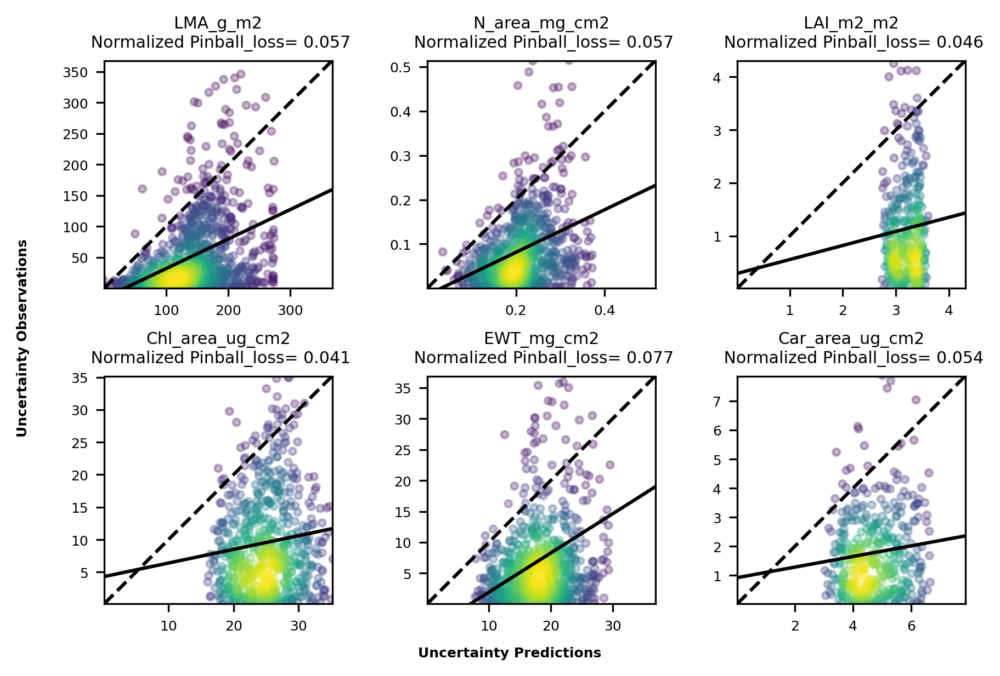

In [15]:
### Scatter plot with density 

b = 3  # Number of columns
a = round(len(list_tr) / b)  # Number of rows
c = 1  # Initialize plot counter

plt.rc('font', size=6)
plt.rcParams['lines.markersize'] = 0.02
plt.rcParams['lines.linewidth'] = 0.01

fig = plt.figure(figsize=(6, 4), dpi=300, constrained_layout=True)

for tr in list_tr:
    ax = plt.subplot(a, b, c)
    # maxv = data_tr[ls_tr[tr]].quantile(0.95)
    # minv = data_tr[ls_tr[tr]].quantile(1-0.95)
    # nor = (maxv-minv)
    
    rescaled_y_pred = apply_model(tr, path_model_tr, dis_err_val, subset).values.flatten()#/nor    
    rescaled_y_true = dis_err_val.loc[:, ls_tr[tr]].reset_index(drop=True).values.flatten()#/nor
    
    # Convert numpy arrays to pandas Series for quantile operations
    rescaled_y_pred_series = pd.Series(rescaled_y_pred)
    rescaled_y_true_series = pd.Series(rescaled_y_true)
    
    # Drop NaNs
    idx = rescaled_y_true_series[rescaled_y_true_series.isna()].index
    rescaled_y_pred_series.drop(idx, inplace=True)
    rescaled_y_true_series.drop(idx, inplace=True)
    
    rescaled_y_pred = rescaled_y_pred_series.values
    rescaled_y_true = rescaled_y_true_series.values
    
    # Calculate quantiles
    lim_min = rescaled_y_true_series.quantile(0.01)
    lim_max = rescaled_y_true_series.quantile(0.99)

    # lim_min = rescaled_y_pred_series.quantile(0.01)
    # lim_max = rescaled_y_pred_series.quantile(0.99)
    
    plt.axis('square')
    x = np.linspace(lim_min, lim_max, 101)
    
    plt.ylim(lim_min, lim_max)
    plt.xlim(lim_min, lim_max)  # Ensure x limits are set correctly
    
    # Plot the identity line
    ax.plot(x, x, 'k--', label='Identity Line', linewidth=1.5)
    
    # Density calculation
    xy = np.vstack([rescaled_y_pred, rescaled_y_true])
    z = gaussian_kde(xy)(xy)

    # Sort the points by density so that higher density points are plotted on top
    idx = z.argsort()
    rescaled_y_pred = rescaled_y_pred[idx]
    rescaled_y_true = rescaled_y_true[idx]
    z = z[idx]
    
    # Scatter plot with density coloring and increased transparency
    ax.scatter(rescaled_y_pred, rescaled_y_true, c=z, s=10, cmap='viridis', alpha=0.3, label='Data Points')
        
    # Calculate and plot the regression line manually
    slope, intercept = np.polyfit(rescaled_y_pred, rescaled_y_true, 1)
    regression_line = slope * x + intercept
    
    ax.plot(x, regression_line, 'k-', label='Regression Line', linewidth=1.5)
    
    # Calculate pinball metric
    pinball_metric = mean_pinball_loss(rescaled_y_true, rescaled_y_pred, alpha=quantile)/(np.quantile(rescaled_y_true, 0.95)-np.quantile(rescaled_y_true, 0.05))
    
    
    
    plt.title(ls_tr[tr] + '\n Normalized Pinball_loss= {:.3f}'.format(pinball_metric))
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    c += 1

# Add super labels
fig.supxlabel('Uncertainty Predictions', size=6, fontweight='bold', ha='center')
fig.supylabel('Uncertainty Observations', size=6, fontweight='bold', ha='center')

# Display the plot
plt.show()


In [41]:
ens_path = './un_predictions/UN_std_ens_training50.csv'
mcdrop_paths = './un_predictions/UN_std_mcdropout_training50.csv'
dist_preds = pd.DataFrame(un_pred_ts).T

ens_preds = pd.read_csv(ens_path).drop(['Unnamed: 0'], axis=1).iloc[dis_err_val.index, :].reset_index(drop=True)
ens_preds.columns = ls_tr

mcdrop_preds = pd.read_csv(mcdrop_paths).drop(['Unnamed: 0'], axis=1).iloc[dis_err_val.index, :].reset_index(drop=True)
mcdrop_preds.columns = ls_tr

In [42]:
def ence_fun(rescaled_y_pred, rescaled_y_true, n_bins = 5):
    import numpy as np
    
    # Example data for predicted uncertainties, true values, and predicted values
    predicted_uncertainties = rescaled_y_pred
    
    #### real uncertainties ###
    squared_errors = rescaled_y_true**2 #(predicted_values - true_values) ** 2
    
    # Binning by predicted uncertainty
    bin_edges = np.linspace(np.min(predicted_uncertainties), np.max(predicted_uncertainties), n_bins + 1)
    bin_indices = np.digitize(predicted_uncertainties, bin_edges, right=True) - 1
    
    # Initialize variables to store bin RMSE, predicted uncertainty, and count
    bin_rmse = np.zeros(n_bins)
    bin_uncertainty = np.zeros(n_bins)
    bin_counts = np.zeros(n_bins)
    
    # Calculate RMSE and average uncertainty for each bin
    for i in range(n_bins):
        bin_mask = bin_indices == i
        bin_counts[i] = np.sum(bin_mask)
        
        if bin_counts[i] > 0:
            # RMSE for each bin (root of average squared error)
            bin_rmse[i] = np.sqrt(np.mean(squared_errors[bin_mask]))
            # Average predicted uncertainty for each bin
            bin_uncertainty[i] = np.mean(predicted_uncertainties[bin_mask])
    
    # Safeguard: avoid division by zero by checking if uncertainty is zero
    # Also handle empty bins by ensuring bin_probs does not use empty bins
    bin_probs = bin_counts / np.sum(bin_counts)
    
    # Prevent division by zero in normalization
    ence = np.sum(bin_probs * np.abs((bin_rmse - bin_uncertainty) / np.clip(bin_uncertainty, 1e-10, None)))
    return ence

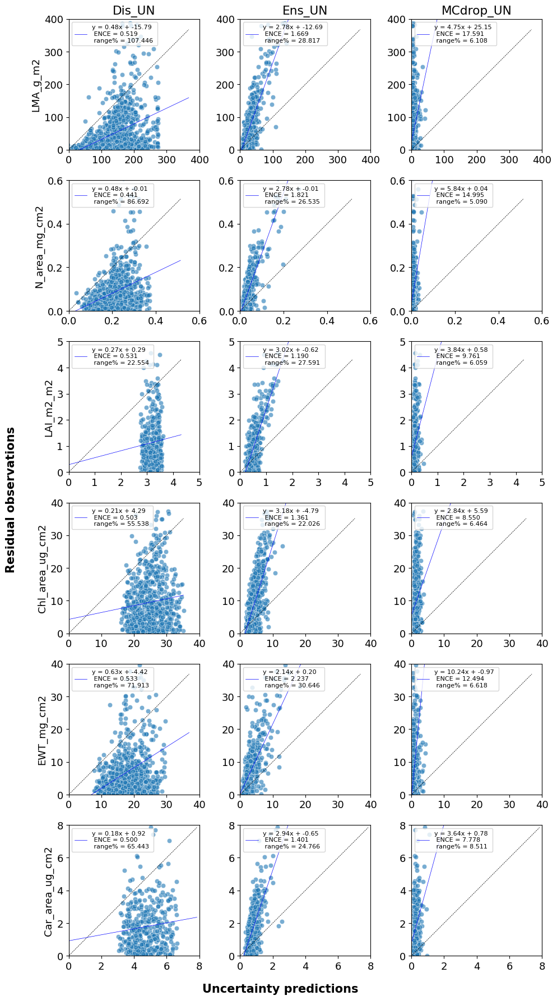

In [43]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import scipy.stats

plt.rc('font', size=13)
plt.rcParams['lines.markersize'] = 6
plt.rcParams['lines.linewidth'] = 0.5

# Number of subplots
list_tr = [0, 1, 2, 4, 5, 6]  # List of indices

alpha = 0.6

# Calculate the number of rows needed based on the number of plots
num_rows = len(list_tr)

# Create a figure and axes
fig, axes = plt.subplots(num_rows, 3, figsize=(10, 3 * num_rows))

# Flatten the 2D array of axes into a 1D array
axes = axes.flatten()
n_bins = 10


# Loop through the subplots
for tr in range(num_rows):
    ax1, ax2, ax3 = axes[3*tr:(tr+1)*3]

    ax1.set(ylabel='{}'.format(ls_tr[list_tr[tr]]))
    
    if tr == 0:
        ax1.set(title='Dis_UN', ylabel='{}'.format(ls_tr[list_tr[tr]]))
        ax2.set(title='Ens_UN')
        ax3.set(title='MCdrop_UN')
    
    plt.axis('square')
    
    # maxv = data_tr[ls_tr[list_tr[tr]]].quantile(0.95)
    # minv = data_tr[ls_tr[list_tr[tr]]].quantile(1-0.95)
    # nor = (maxv-minv)

    # First subplot (Dis_UN)
    rescaled_y_pred = dist_preds.iloc[:, tr].reset_index(drop=True)#/nor
    rescaled_y_true = dis_err_val.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True)#/nor
    
    idx = np.union1d(np.where(np.isnan(rescaled_y_true.values.reshape(1, -1)))[1],
                     np.where(np.isnan(rescaled_y_pred.values.reshape(1, -1)))[1])
    
    rescaled_y_pred = pd.DataFrame(rescaled_y_pred).drop(idx, axis=0)
    rescaled_y_true = pd.DataFrame(rescaled_y_true).drop(idx, axis=0)
    
    lim_min = rescaled_y_true.quantile(0.01).values[0]
    lim_max = rescaled_y_true.quantile(0.99).values[0]

    x = np.linspace(lim_min, lim_max, 101)
    ax1.plot(x, x, 'k--')

    sns.scatterplot(x=rescaled_y_pred.values.flatten(), y=rescaled_y_true.values.flatten(), ax=ax1, alpha=alpha, legend=False)

    # Regression line and equation
    slope, intercept = np.polyfit(rescaled_y_pred.values.flatten(), rescaled_y_true.values.flatten(), 1)
    ence_metric = ence_fun(rescaled_y_pred, rescaled_y_true, n_bins = n_bins)
    range_ = (rescaled_y_pred.quantile(.95).values[0]-rescaled_y_pred.quantile(.05).values[0])/(rescaled_y_true.quantile(.95).values[0]-rescaled_y_true.quantile(.05).values[0])
    
    # Include both fitting score and regression equation in the legend label
    legend_label = f'y = {slope:.2f}x + {intercept:.2f} \n ENCE = {ence_metric:.3f} \n range% = {range_*100:.3f} '
    ax1.plot(x, slope * x + intercept, label=legend_label, color='b')

    # Add the legend to the subplot
    ax1.legend(loc='upper left', fontsize=8)
    
    # Second subplot (ens_UN)
    rescaled_y_pred = (1e0 * ens_preds.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True))#/nor
    rescaled_y_true = dis_err_val.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True)#/nor
    
    idx = np.union1d(np.where(np.isnan(rescaled_y_true.values.reshape(1, -1)))[1],
                     np.where(np.isnan(rescaled_y_pred.values.reshape(1, -1)))[1])
    
    rescaled_y_pred = pd.DataFrame(rescaled_y_pred).drop(idx, axis=0)
    rescaled_y_true = pd.DataFrame(rescaled_y_true).drop(idx, axis=0)

    sns.scatterplot(x=rescaled_y_pred.values.flatten(), y=rescaled_y_true.values.flatten(),
                    ax=ax2, alpha=alpha, legend=False)
    ax2.plot(x, x, 'k--')

    slope, intercept = np.polyfit(rescaled_y_pred.values.flatten(), rescaled_y_true.values.flatten(), 1)
    ence_metric = ence_fun(rescaled_y_pred, rescaled_y_true, n_bins = n_bins)
    range_ = (rescaled_y_pred.quantile(.95).values[0]-rescaled_y_pred.quantile(.05).values[0])/(rescaled_y_true.quantile(.95).values[0]-rescaled_y_true.quantile(.05).values[0])
    
    
    # Include both fitting score and regression equation in the legend label
    legend_label = f'y = {slope:.2f}x + {intercept:.2f} \n ENCE = {ence_metric:.3f} \n range% = {range_*100:.3f} '
    ax2.plot(x, slope * x + intercept, label=legend_label, color='b')
    
    # Add the legend to the subplot
    ax2.legend(loc='upper left', fontsize=8)
    
    # Third subplot (mcdrop_UN)
    
    rescaled_y_pred = (1e0 * mcdrop_preds.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True))#/nor
    rescaled_y_true = dis_err_val.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True)#/nor
    
    idx = np.union1d(np.where(np.isnan(rescaled_y_true.values.reshape(1, -1)))[1],
                     np.where(np.isnan(rescaled_y_pred.values.reshape(1, -1)))[1])

    rescaled_y_pred = pd.DataFrame(rescaled_y_pred).drop(idx, axis=0)
    rescaled_y_true = pd.DataFrame(rescaled_y_true).drop(idx, axis=0)

    sns.scatterplot(x=rescaled_y_pred.values.flatten(), y=rescaled_y_true.values.flatten(),
                    ax=ax3, alpha=alpha, legend=False)
    ax3.plot(x, x, 'k--')

    slope, intercept = np.polyfit(rescaled_y_pred.values.flatten(), rescaled_y_true.values.flatten(), 1)
    ence_metric = ence_fun(rescaled_y_pred, rescaled_y_true, n_bins = n_bins)
    range_ = (rescaled_y_pred.quantile(.95).values[0]-rescaled_y_pred.quantile(.05).values[0])/(rescaled_y_true.quantile(.95).values[0]-rescaled_y_true.quantile(.05).values[0])
    

    legend_label = f'y = {slope:.2f}x + {intercept:.2f} \n ENCE = {ence_metric:.3f} \n range% = {range_*100:.3f} '
    ax3.plot(x, slope * x + intercept, label=legend_label, color='b')

    # Add the legend to the subplot
    ax3.legend(loc='upper left', fontsize=8)
    
    # Synchronize plot limits
    ax1.set_ylim(lim_min, lim_max)
    ax1.set(xticks=ax1.get_yticks(), yticks=ax1.get_yticks())
    ax1.set_xlim(ax1.get_ylim())
    ax1.set_aspect('equal', adjustable='box')

    ax2.set(xticks=ax1.get_yticks(), yticks=ax1.get_yticks())
    ax2.set_xlim(ax1.get_ylim())
    ax2.set_ylim(ax1.get_ylim())
    ax2.set_aspect('equal', adjustable='box')

    ax3.set(xticks=ax1.get_yticks(), yticks=ax1.get_yticks())
    ax3.set_xlim(ax1.get_ylim())
    ax3.set_ylim(ax1.get_ylim())
    ax3.set_aspect('equal', adjustable='box')

fig.supxlabel('Uncertainty predictions', size=15, fontweight='bold', ha='center')
fig.supylabel('Residual observations', size=15, fontweight='bold', ha='center')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plots
plt.show()

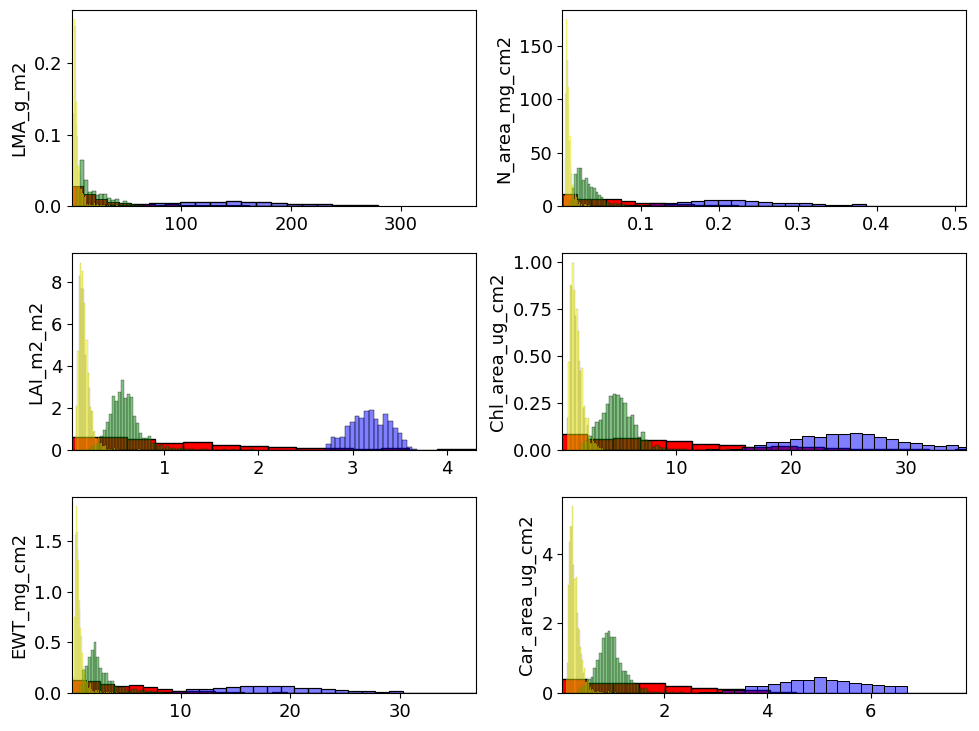

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Number of subplots
list_tr = [0, 1, 2, 4, 5, 6]  # List of trait indices

# Calculate the number of rows and columns for a 2-column layout
num_cols = 2
num_rows = int(np.ceil(len(list_tr) / num_cols))

# Create a figure and axes with 2 columns
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 2.5 * num_rows))

# Flatten the axes array for easier indexing (handles single-row case)
axes = np.ravel(axes)

# Loop through the subplots
for tr in range(len(list_tr)):
    ax = axes[tr]

    # Get the trait label
    trait_label = '{}'.format(ls_tr[list_tr[tr]])
    ax.set(ylabel=trait_label)

    # Convert predictions to numpy arrays to avoid multi-dimensional indexing errors
    try:
        rescaled_y_true = dis_err_val.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True)
        rescaled_y_pred_dis = dist_preds.iloc[:, tr].reset_index(drop=True)
        rescaled_y_pred_ens = (1e0 *ens_preds.loc[:, ls_tr[list_tr[tr]]].reset_index(drop=True))
        rescaled_y_pred_mc = (1e0 * mcdrop_preds.loc[:, ls_tr[list_tr[tr]]]).reset_index(drop=True)
    except KeyError:
        print(f"KeyError: {ls_tr[list_tr[tr]]} not found in dataframes!")
        continue

    # Compute 1st and 99th quantiles for y-axis limits
    lim_min = rescaled_y_true.quantile(0.01)
    lim_max = rescaled_y_true.quantile(0.99)
    ax.set_xlim(lim_min, lim_max)  # Set y-axis limits

    # Plot histograms for all three methods on the same axes
    sns.histplot(rescaled_y_true.values.flatten(), ax=ax, color='red', label='True_UN', stat='density', alpha=1) 
    sns.histplot(rescaled_y_pred_dis.values.flatten(), ax=ax, color='blue', label='Dis_UN', stat='density', alpha=0.5)
    sns.histplot(rescaled_y_pred_ens.values.flatten(), ax=ax, color='green', label='Ens_UN', stat='density', alpha=0.5)
    sns.histplot(rescaled_y_pred_mc.values.flatten(), ax=ax, color='yellow', label='MCDrop_UN', stat='density', alpha=0.5)

    # Set legend
    # ax.legend()

# Hide any unused subplots (if the number of traits is odd)
for i in range(len(list_tr), len(axes)):
    fig.delaxes(axes[i])

# Show the final plot
plt.tight_layout()
plt.show()

## inference ###

In [ ]:
subset = ['qu50_dist_EmbLCos_nor',
'qu50_dist_SpCos_nor']

path_model_tr = './Un_models_95QuReg/'
quantile = 0.95
list_tr = [0, 1, 2, 4, 5, 6]  # List of indices

In [44]:

####### Paths #### 
enmap_im_path = './Data/CaseStudies/EnMAP/clip2_south.tif' ##./Data/CaseStudies/EnMAP/clip2_south.tif  ./CaseStudies/NEON/clip_Liro_3.tif
bands_path = './Data/CaseStudies/EnMAP/EnmapBands.csv' # ./Data/CaseStudies/EnMAP/EnmapBands.csv ./Data/CaseStudies/NEON/NEON_bands.csv
path_inf = './distances/DistQuInferenceEnMAP_50neighFaiss_SpLastlayQuNor.csv' #DistQuInferenceEnMAP_50neighFaiss_SpLastlayQuNor DistQuInferenceNEON_50neighFaiss_SpLastlayQuNor.csv

In [ ]:
bands = pd.read_csv((bands_path))['bands'].astype(float)
src = rasterio.open(enmap_im_path)
array = src.read()

dis_inference = pd.read_csv(path_inf).drop(['Unnamed: 0'], axis=1)
src, df, idx_null = image_processing(enmap_im_path, bands_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0219..0.6669].


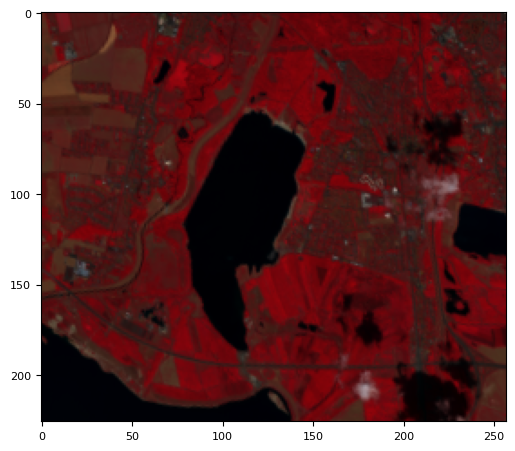

In [47]:
src, df, idx_null = image_processing(enmap_im_path, bands_path)

# nrg = falseColVis(enmap_im_path)
plt.rc('font', size=10)


fig = figure(figsize=(6, 9))
plt.rc('font', size=8)

######### enmap
# Red Band: 630–680 nm
# NIR Band: 800–850 nm

######### enmap
nir = src.read(70)/10000
red = src.read(46)/10000

# ######### neon
# nir = src.read(89)/10000
# red = src.read(55)/10000

green = src.read(27)/10000
blue = src.read(6)/10000
swir = src.read(153)/10000

# Stack bands
nrg = np.dstack((nir, red, green)) ## False color
# View the color composite
plt.imshow(nrg) #, cmap='pink'


In [48]:
import spyndex

# Compute the kNDVI and the NDVI for comparison
idx = spyndex.computeIndex(
    index = ["NDVI","kNDVI"],
    params = {
        # Parameters required for NDVI
        "N": nir,
        "R": red,
        # Parameters required for kNDVI
        "kNN" : 1.0,
        "kNR" : spyndex.computeKernel(
            kernel = "RBF",
            params = {
                "a": nir,
                "b": red,
                "sigma": np.dstack((nir, red)).mean()
            }),
    }
)

/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
<string>:1: RuntimeWarning: divide by zero encountered in divide


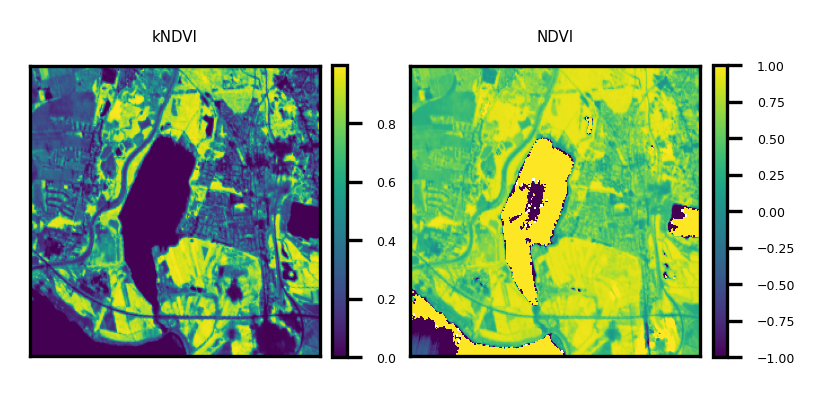

In [49]:
import matplotlib.ticker as ticker

# Create a figure and axis
plt.rc('font', size=3)
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(3, 2), dpi=300, sharex=True, sharey=True, gridspec_kw={'width_ratios': [1, 1]})
extent = src.bounds

ori_im = ax1.imshow(idx[1], extent=extent, aspect='auto')
cbar = plt.colorbar(ori_im, ax=ax1, fraction=0.046, pad=0.04)  # Adjust fraction and pad as needed

pred_im = ax2.imshow(idx[0],vmin= -1, vmax=1,extent=extent,  aspect='auto') ### divergeant : PuOr, BrBG ##gnuplot, BrBG, Greens

# Add colorbar to the second subplot
cbar = plt.colorbar(pred_im, ax=ax2, fraction=0.046, pad=0.04)  # Adjust fraction and pad as needed

ax1.set(title='kNDVI')
ax2.set(title='NDVI')

ax1.set_aspect('equal')
ax2.set_aspect('equal')

ax1.set_axis_off
ax2.set_axis_off

ax1.xaxis.set_major_locator(ticker.NullLocator())
ax1.yaxis.set_major_locator(ticker.NullLocator())

#### Trait Predictions

In [ ]:
from feature_module_F import *
from data_module_F import *
from Un_Module import load_model

import tensorflow as tf

path_model = './DL_Model/'
df_transformed = transform_data(df)

best_model, scaler_list = load_model(path_model)

# Define a new model for Monte Carlo Dropout
mc_model = tf.keras.models.clone_model(best_model)
mc_model.set_weights(best_model.get_weights())

predictions = best_model.predict(df_transformed.values, verbose=1)
sc_predictions = scaler_list.inverse_transform(predictions)

In [555]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten

lay = -4

#### Embedding layer ##
activation_modelL = Model(inputs = best_model.input, outputs= Flatten()(best_model.layers[lay].output)) ## for effiecient net

# # Traning ######
activations_trL = activation_modelL.predict(data_tr.iloc[:,69:].values,verbose=1)   
# Test scene_ clip ######
activations_tsL = activation_modelL.predict(df_transformed.values ,verbose=1) #df_transformed

2048/2048 [==============================] - 157s 77ms/step


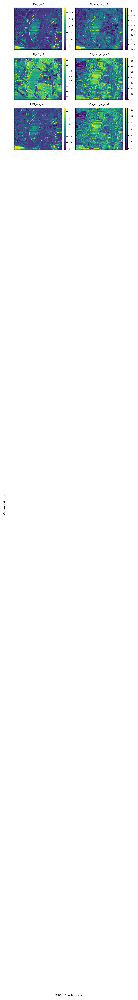

In [ ]:
import matplotlib.ticker as ticker

plt.rc('font', size=10)

list_tr = [0,1,2,4,5,6]
thre = 0.99

a = len(ls_tr) # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = figure(figsize=(4,30), dpi=300)

# plt.figure(figsize=(4,30), dpi=300) #, constrained_layout=True
plt.rc('font', size=4)

preds_df = pd.DataFrame(sc_predictions, columns=ls_tr)

un_pred_ts = []
for tr in list_tr:

    ax = plt.subplot(a,b,c) #, sharex=plt.gca(), sharey=plt.gca()
    
    un_tr = preds_df.iloc[:,tr]
    maxv = un_tr.quantile(thre)
    minv = un_tr.quantile(1-thre)

    pred_im = ax.imshow((un_tr).values.reshape(array.shape[1],array.shape[2]), vmin= minv, vmax=maxv) ### divergeant : PuOr, BrBG ##gnuplot, BrBG, Greens
    # Add a color bar with equal length
    cbar = plt.colorbar(pred_im, fraction=0.04, pad=0.04, ax=ax)
    
    # Disable axis tickers using NullLocator
    plt.gca().xaxis.set_major_locator(ticker.NullLocator())
    plt.gca().yaxis.set_major_locator(ticker.NullLocator())

    plt.title(ls_tr[tr])
    # plt.legend()
    c = c + 1

fig.supxlabel('95Qu Predictions', size=6, fontweight='bold', ha='center')
fig.supylabel('Observations', size=6, fontweight='bold', ha='center')


# Adjust layout to prevent overlapping
plt.tight_layout()
plt.subplots_adjust()

# Show the plots
plt.show()


#### Viz predictions UN

/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PowerTransformer from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from

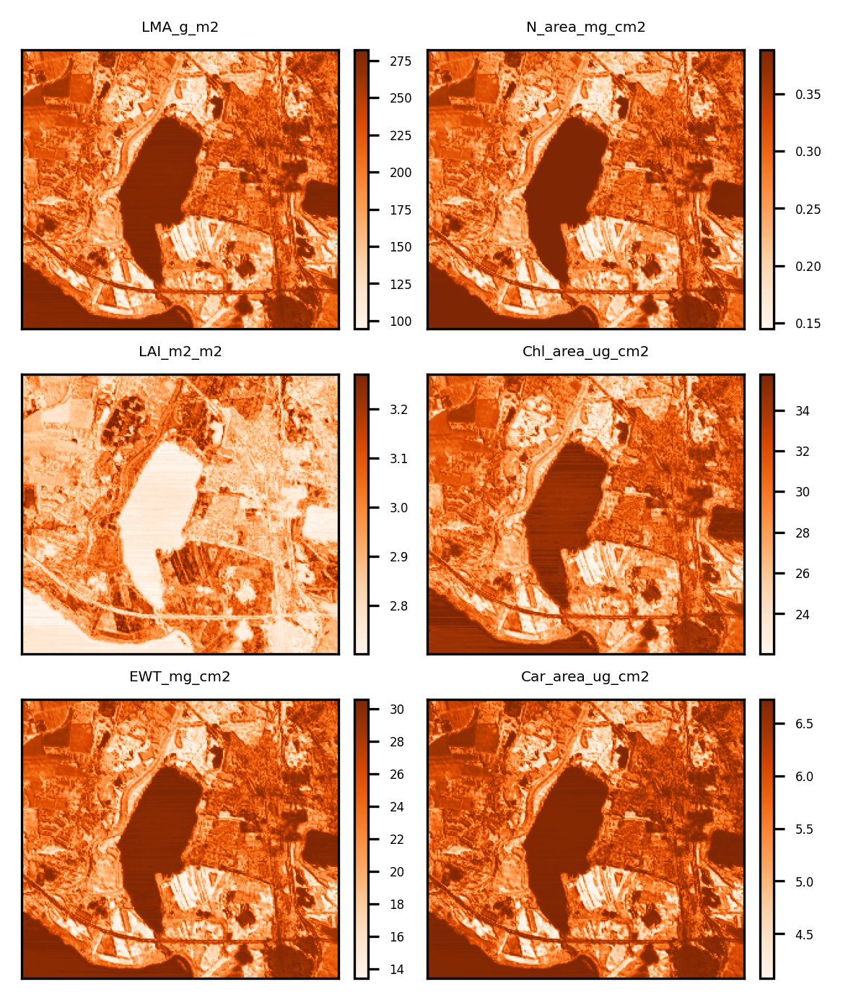

In [52]:
import matplotlib.ticker as ticker

plt.rc('font', size=10)

list_tr = [0,1,2,4,5,6]
thre = 0.99

a = len(ls_tr) # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

plt.figure(figsize=(4,30), dpi=300) #, constrained_layout=True
plt.rc('font', size=4)

un_pred_ts = []
for tr in list_tr:

    ax = plt.subplot(a,b,c) #, sharex=plt.gca(), sharey=plt.gca()
    
    un_tr = apply_model(tr, path_model_tr, dis_inference, subset)
    maxv = un_tr.quantile(thre)
    minv = un_tr.quantile(1-thre)

    pred_im = ax.imshow((un_tr).values.reshape(array.shape[1],array.shape[2]), vmin= minv, vmax=maxv, cmap='Oranges') ### divergeant : PuOr, BrBG ##gnuplot, BrBG, Greens
    # Add a color bar with equal length
    cbar = plt.colorbar(pred_im, fraction=0.04, pad=0.04, ax=ax)
    
    # Disable axis tickers using NullLocator
    plt.gca().xaxis.set_major_locator(ticker.NullLocator())
    plt.gca().yaxis.set_major_locator(ticker.NullLocator())

    plt.title(ls_tr[tr])
    # plt.legend()
    c = c + 1

fig.supxlabel('95Qu Predictions', size=6, fontweight='bold', ha='center')
fig.supylabel('Observations', size=6, fontweight='bold', ha='center')


# Adjust layout to prevent overlapping
plt.tight_layout()
plt.subplots_adjust()

# Show the plots
plt.show()

In [ ]:
############## With sate of the art methods ####
ens_preds = pd.read_csv('./un_predictions/UN_std_ens_EnMAP_inference.csv').drop(['Unnamed: 0'], axis=1) ##./un_predictions/UN_std_ens_EnMAP_inference.csv  ./un_predictions/UN_std_ens_NEON_inference.csv
mcdrop_preds = pd.read_csv('./un_predictions/UN_std_mcdropout_EnMAP_inference.csv').drop(['Unnamed: 0'], axis=1) ##./un_predictions/UN_std_mcdropout_EnMAP_inference.csv  ./un_predictions/UN_std_mcdropout_NEON_inference.csv

/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PowerTransformer from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from

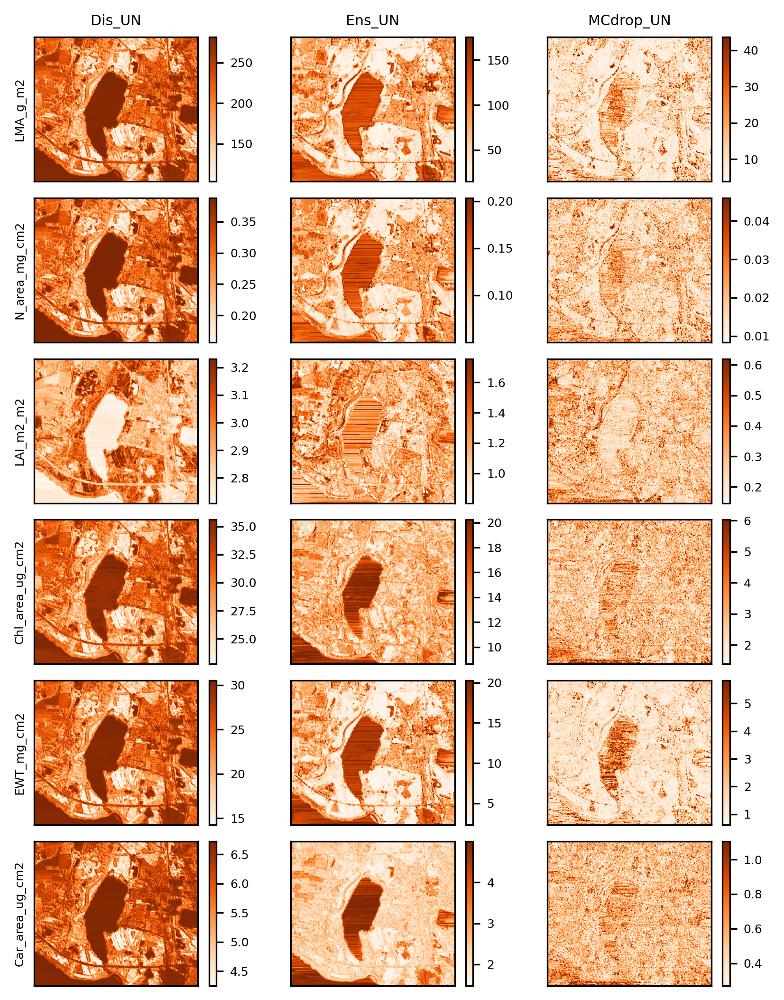

In [57]:
########### visualize ######## uncertainty 5 traits ######
import matplotlib.ticker as ticker
plt.style.use('default')
plt.rc('font', size=6)
plt.rcParams['lines.markersize'] = 3
plt.rcParams['lines.linewidth'] = 0.5

list_tr = [0,1,2,4,5,6]

# Create a figure and axes
fig, axes = plt.subplots(len(list_tr), 3, figsize=(6,7), dpi=300, sharex=True, sharey=True, gridspec_kw={'width_ratios': [1.10, 1.10, 1.10]})

# Flatten the 2D array of axes into a 1D array
axes = axes.flatten()
thre = 0.98

for i in range(len(list_tr)):
    # Create a figure and axis
    ax1, ax2, ax3 = axes[3*i:(i+1)*3]
    tr = list_tr[i]
    
    ax1.set(ylabel='{}'.format(ls_tr[tr]))
    
    if (i==0):
        ax1.set(title='Dis_UN', ylabel='{}'.format(ls_tr[tr]))
        ax2.set(title='Ens_UN')
        ax3.set(title='MCdrop_UN')

    # maxv = data_tr[ls_tr[tr]].quantile(0.95)
    # minv = data_tr[ls_tr[tr]].quantile(1-0.95)
    # nor = (maxv-minv)
    

    un_tr = apply_model(tr, path_model_tr, dis_inference, subset)#/nor
    # un_tr = np.log(un_tr)
    maxv = un_tr.quantile(thre)
    minv = un_tr.quantile(1-thre)
    # maxv = dis_err_tr[ls_tr[tr]].quantile(thre)
    # minv = dis_err_tr[ls_tr[tr]].quantile(1-thre)
    
    un_im = ax1.imshow((un_tr).values.reshape(src.shape[0],src.shape[1]),cmap='Oranges', aspect='auto',vmin= minv, vmax=maxv) #Oranges
    # Add colorbar to the second subplot
    cbar = plt.colorbar(un_im, ax=ax1, fraction=0.04, pad=0.04)  # Adjust fraction and pad as needed

    un_tr = (2e0* ens_preds.iloc[:,tr])#/nor
    # un_tr = np.log(un_tr)
    maxv = un_tr.quantile(thre)
    minv = un_tr.quantile(1-thre)
    # maxv = dis_err_tr[ls_tr[tr]].quantile(thre)
    # minv = dis_err_tr[ls_tr[tr]].quantile(1-thre)
    
    un_im_ens = ax2.imshow((un_tr).values.reshape(src.shape[0],src.shape[1]),cmap='Oranges', aspect='auto',vmin= minv, vmax=maxv,) #Oranges
    # Add colorbar to the second subplot
    cbar = plt.colorbar(un_im_ens, ax=ax2, fraction=0.04, pad=0.04)  # Adjust fraction and pad as needed
    
    un_tr = (2e0*mcdrop_preds.iloc[:,tr])#/nor
    # un_tr = un_tr *1e6 #np.log(un_tr)
    maxv = un_tr.quantile(thre)
    minv = un_tr.quantile(1-thre)
    # maxv = dis_err_tr[ls_tr[tr]].quantile(thre)
    # minv = dis_err_tr[ls_tr[tr]].quantile(1-thre)
    
    un_im_drop = ax3.imshow((un_tr).values.reshape(src.shape[0],src.shape[1]),cmap='Oranges', aspect='auto',vmin= minv, vmax=maxv) #Oranges PuOr
    # Add colorbar to the second subplot
    cbar = plt.colorbar(un_im_drop, ax=ax3, fraction=0.04, pad=0.04)  # Adjust fraction and pad as needed

    ax1.set_aspect('equal')
    ax2.set_aspect('equal')
    ax3.set_aspect('equal')
    
    ax1.xaxis.set_major_locator(ticker.NullLocator())
    ax1.yaxis.set_major_locator(ticker.NullLocator())
    
    plt.tight_layout()


## Scene Components ###

In [ ]:
lc_names = {
    10:'Tree_cover',
    20:'shrubland',
    30:'grassland',
    40:'cropland', #Flooded_vegetation
    50:'urban',
    60:'soil',
    70:'snow-ice',
    80:'water',
    90:'wetland',
    95:'mangroves',
    100:'moss-lichen', #Rangeland
    110: 'tree-shadow'

}



In [65]:
# import numpy as np
from scipy.stats import wilcoxon, kruskal, mannwhitneyu, kstest

def jeffries_matusita_distance(pdf1, pdf2):
    """
    Calculate the Jeffries-Matusita distance between two probability distributions.

    Parameters:
    - pdf1: Probability distribution of group 1 (NumPy array representing the PDF).
    - pdf2: Probability distribution of group 2 (NumPy array representing the PDF).

    Returns:
    - JM distance: The Jeffries-Matusita distance between the two probability distributions.
    """
    
    if len(pdf1) != len(pdf2):
        raise ValueError("Both probability distributions must have the same length.")

    jm_distance = 0.0

    for i in range(len(pdf1)):
        jm_distance += np.sqrt(pdf1[i] * pdf2[i])

    jm_distance = np.sqrt(1 - jm_distance)

    return jm_distance


def jeffries_matusita_distance_toveg(veg_un, other_un):
    ### difference between normalized uncertainties ## 
    X1 = veg_un.dropna().values.reshape(1,-1)[0]
    X2 = other_un.dropna().values.reshape(1,-1)[0]
     
    # Calculate the PDFs for the sample data (e.g., using histograms)
    pdf1, _ = np.histogram(X1, bins=10, density=True)
    pdf2, _ = np.histogram(X2, bins=10, density=True)
    
    # Normalize the PDFs to ensure they sum to 1
    pdf1 = pdf1 / np.sum(pdf1)
    pdf2 = pdf2 / np.sum(pdf2)
    
    agg = jeffries_matusita_distance(pdf1, pdf2)
    return agg

In [71]:
import rasterio
from rasterio.warp import transform_bounds

from pystac_client import Client
import os
from rio_tiler.io import STACReader
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd


# Open your raster image
with rasterio.open(enmap_im_path) as src:
    raster_data = src.read(1)
    raster_crs = src.crs
    raster_transform = src.transform
    raster_meta = src.meta

    # Get the dimensions of the raster
    width = src.width
    height = src.height
    
    bbox = src.bounds

    # Define the target CRS (WGS84)
    dst_crs = 'EPSG:4326'

    # Transform the bounding box to WGS84
    transformed_bbox = transform_bounds(raster_crs, dst_crs, *bbox)

# print("Bounding Box:", bbox)
print("Bounding Box in WGS84 (EPSG:4326):", transformed_bbox)

Bounding Box in WGS84 (EPSG:4326): (12.28648913732442, 51.237421694646294, 12.400401402299568, 51.30082907758387)


In [ ]:
#https://github.com/ESA-WorldCover/esa-worldcover-datasets/blob/main/notebooks/01-Explore_dataset_STAC.ipynb

stac_endopoint = 'https://services.terrascope.be/stac/'

# collection ids for both maps in the Terrascope STAC Catalogue
collection_ids = {2020: 'urn:eop:VITO:ESA_WorldCover_10m_2020_AWS_V1',
                  2021: 'urn:eop:VITO:ESA_WorldCover_10m_2021_AWS_V2'}

# WSG84 coordinates of Mol, Belgium
bbox = list(transformed_bbox)

client = Client.open(stac_endopoint)

# Let's query products for the 2021 map 
year = 2021
search_results = client.search(
    collections=[collection_ids[year]],
    bbox=bbox
)

# Search results fetched and represented as dictionary
results = search_results.get_all_items()
# results.to_dict()

/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/pystac_client/item_search.py:851: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


In [73]:
# this is to tell GDAL we do not need authentication
os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'

# name of the map asset
asset = 'ESA_WORLDCOVER_10M_MAP'
item = results[0]

with STACReader(None, item=item) as stac:
    img = stac.part(bbox, assets=asset)

In [74]:
from rasterio.warp import reproject, Resampling

masks = []
coarse_data = raster_data #src.read(1)

# fine_src = rasterio.open(path)
# fine_data = fine_src.read(1)
fine_data = img.data[0]

reprojected_data = np.empty(coarse_data.shape, dtype=fine_data.dtype)

# Reproject and resample (coarser resolution) the fine raster to match the CRS and spatial extent of the coarse raster
rasterio.warp.reproject(
    source = fine_data,
    destination = reprojected_data,
    src_transform = img.transform,
    src_crs = img.crs,
    dst_transform = src.transform,
    dst_crs = src.crs,
    resampling = Resampling.average
)
# masks.append(reprojected_data.copy())

(array([[40, 38, 15, ..., 34, 50, 50],
        [40, 40, 23, ..., 38, 50, 50],
        [40, 40, 29, ..., 39, 50, 50],
        ...,
        [80, 80, 80, ..., 40, 40, 40],
        [80, 80, 80, ..., 40, 40, 40],
        [80, 80, 80, ..., 40, 40, 40]], dtype=uint8),
 Affine(30.0, 0.0, 310833.0,
        0.0, -30.0, 5686497.0))

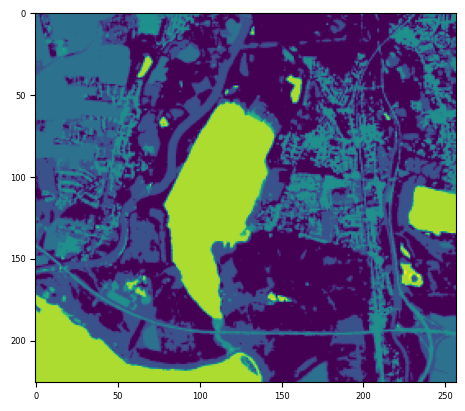

In [75]:
plt.imshow(reprojected_data.copy())

In [ ]:
############### Scene components loading ########
lc_laod = pd.read_csv('./Data/CaseStudies/EnMAP/southLeipzig2_mask_lc.csv').drop(['Unnamed: 0'],axis=1) ### ./Data/CaseStudies/EnMAP/southLeipzig2_mask_lc.csv ./Data/CaseStudies/NEON/Liro3_mask_lc.csv
mask = lc_laod['0'].values.reshape(array[0,:,:].shape) 

In [ ]:
# Define the label map based on the color_map
label_map = {
    10: "Veg",
    50: "Urban",
    80: "Water",
    110: "Shadow",
    120: "Cloud"
}

# Create a function to map the mask values to string labels
def map_mask_to_labels(mask, label_map):
    label_array = np.full(mask.shape, np.nan, dtype=object)  # Default to "Unknown"
    for value, label in label_map.items():
        label_array[mask == value] = label
    return label_array

# Map the mask to labels
lc_gen = pd.DataFrame(map_mask_to_labels(mask, label_map).reshape((-1,)))

,0
0,Veg
1,Veg
2,Veg
3,Veg
4,Veg
...,...
58077,Veg
58078,Veg
58079,Veg
58080,Veg


In [78]:
lc = pd.DataFrame(pd.DataFrame(reprojected_data).values.reshape(-1,1))[0].map(lc_names)

# Define values to replace
replace_values = ['nan', 'urban', 'snow-ice', 'soil', 'water']

# # Replace with NaN
lc = lc.replace(replace_values, np.nan)

/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PowerTransformer from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/tmp/ipykernel_57725/243464651.py:55: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future vers

Text(0.02, 0.5, 'Uncertainty estimation')

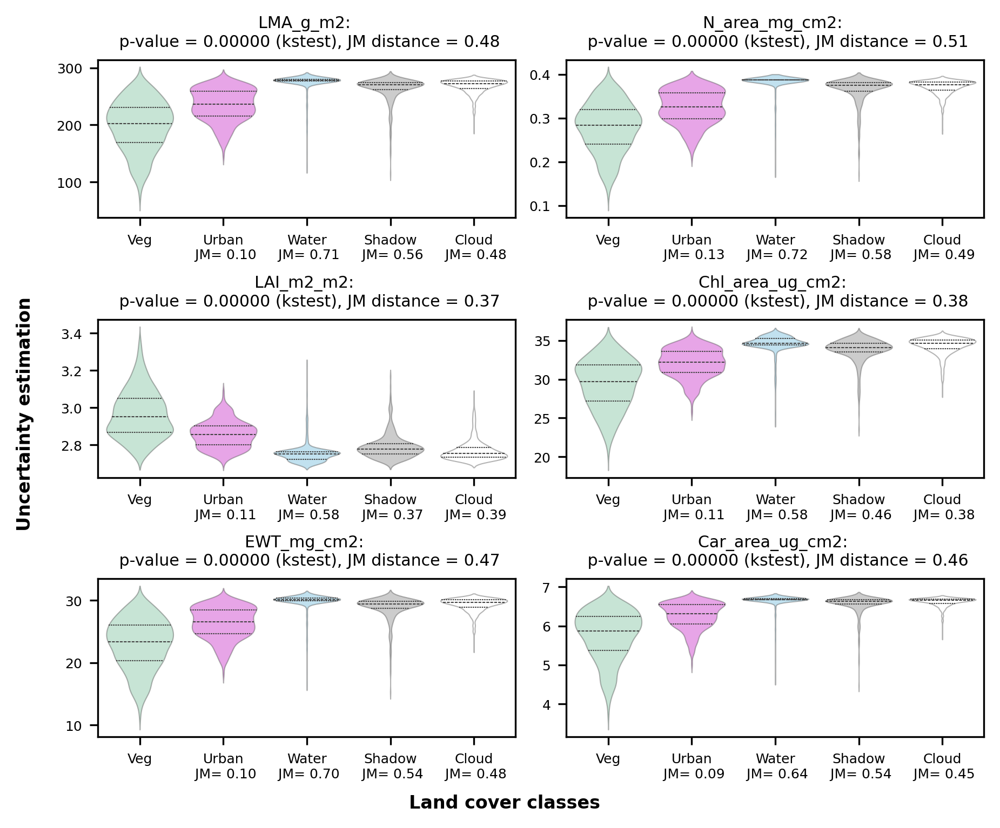

In [ ]:
list_tr = [0,1,2,4,5,6]
# list_tr = range(len(Traits))

b = 2  # number of columns
a = round((len(list_tr))/b) # number of rows
c = 1  # initialize plot counter

fig = plt.figure(figsize=(6, 5), dpi=300 ,constrained_layout=True)

plt.rc('font', size=6)
plt.rcParams['lines.markersize'] = 0.01
plt.rcParams['lines.linewidth'] = 0.01

sample_num_per_class = 500


# Define the color map
color_map = {
    'Veg': (103/255, 201/255, 151/255),  # Vegetation
    'Urban': (223/255, 5/255, 224/255),    # Urban
    'Water': (82/255, 189/255, 235/255),   # Water
    'Shadow': (128/255, 128/255, 128/255), # Shadow
    'Cloud': (255/255, 255/255, 255/255)  # Cloud
}

# Convert the color map to a format seaborn understands
palette = {str(key): value for key, value in color_map.items()}


for tr in list_tr:
    ax = plt.subplot(a, b, c)
    # maxv = data_tr[ls_tr[tr]].quantile(0.95)
    # minv = data_tr[ls_tr[tr]].quantile(1-0.95)
    # nor = (maxv-minv)
    
    un_tr = apply_model(tr, path_model_tr, dis_inference, subset)#/nor
    
    un_meta = pd.concat([un_tr, lc_gen], axis=1)#.T.reset_index(drop=True)
    un_meta.columns=['Un', 'lc']

    test = un_meta.copy()
    test = test.dropna(subset=['Un'])
    test = test.dropna(subset=['lc'])
    
    labels = list(test.lc.unique()) #['Veg', 'Shadow', 'Water'] #list(test.lc.unique())
    # print(labels)
    
    skip = 1 #4
    
    # ## sampling ##
    sample_num_per_class = test.groupby(['lc']).count().Un.min()
    test_veg = test.groupby(['lc']).get_group('Veg').apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    test_oth = test.drop(test.groupby(['lc']).get_group('Veg').index).groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    test = pd.concat([test_veg, test_oth], axis=0).reset_index(drop=True)
    
    veg_un = test.groupby(['lc']).get_group('Veg')['Un']    
    # other_ls = [test.groupby(['lc']).get_group(lc)['Un'] for lc in labels[3:]]
    other_ls = [test.groupby(['lc']).get_group(lc)['Un'] for lc in labels[skip:]]
    other_un = pd.concat(other_ls).dropna()
        
    agg_class =[jeffries_matusita_distance_toveg(veg_un, other_ls[other_idx]) for other_idx in range(len(labels[skip:]))]
    agg = jeffries_matusita_distance_toveg(veg_un, other_un)
    
    stat, p = kstest(veg_un.dropna().values.reshape(1,-1)[0], other_un.values.reshape(1,-1)[0])
    
    sns.violinplot(x="lc", y='Un', hue= "lc", data=test, native_scale=True, linewidth=0.5,  ax=ax, inner='quartile', legend=False, order=labels, palette=palette, alpha=1)
        
    for j in range(len(labels[skip:])):
        labels[j+skip] = labels[j+skip]+ '\n JM= {:.2f}'.format(agg_class[j])
    ax.set_xticklabels(labels)
    
    plt.title('{}: \n p-value = {:.5f} (kstest), JM distance = {:.2f}'.format(ls_tr[tr], p, agg)) 
    plt.setp(ax.collections, alpha=.4)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    c = c + 1

fig.supxlabel('Land cover classes', size=8, fontweight='bold', ha='center')
fig.supylabel('Uncertainty estimation', size=8, fontweight='bold', ha='center')  


/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PowerTransformer from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/tmp/ipykernel_57725/159898192.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future ve

Text(0.02, 0.5, 'Uncertainty estimation')

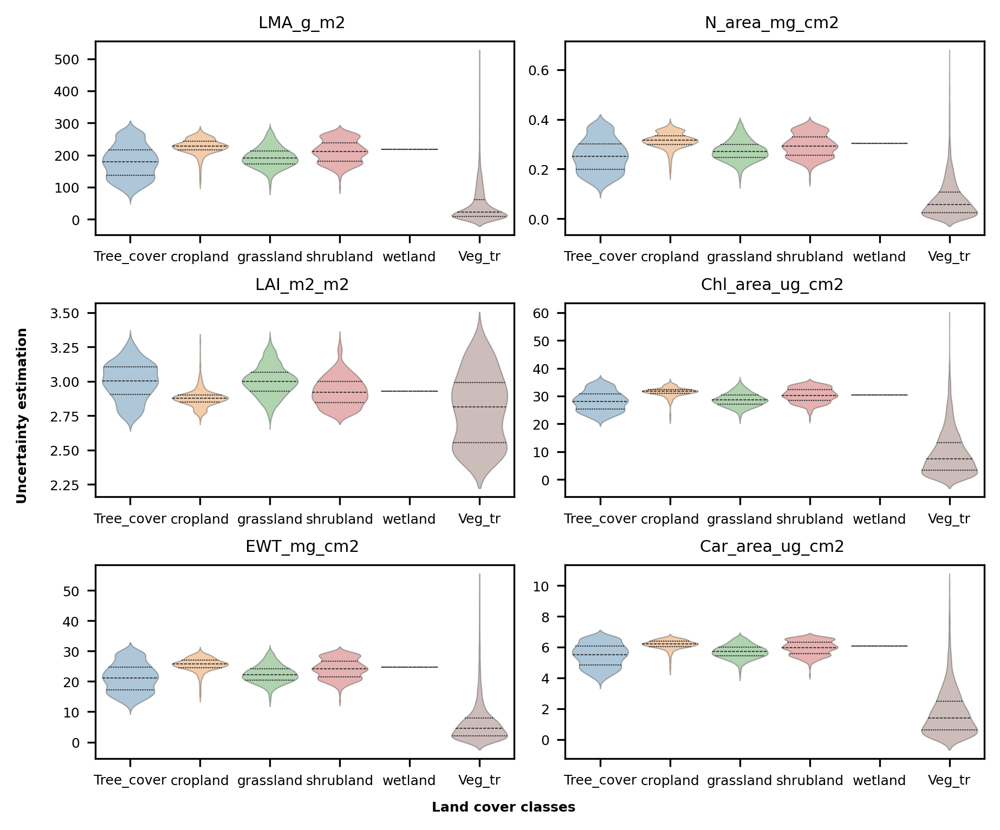

In [80]:
list_tr = [0,1,2,4,5,6]
# list_tr = range(len(Traits))

b = 2  # number of columns
a = round((len(list_tr))/b) # number of rows
c = 1  # initialize plot counter

sample_num_per_class = 1000
# fig = plt.figure(figsize=(6, 9), dpi=300 ,constrained_layout=True)

fig = plt.figure(figsize=(6, 5), dpi=300 ,constrained_layout=True)

plt.rc('font', size=6)
plt.rcParams['lines.markersize'] = 0.01
plt.rcParams['lines.linewidth'] = 0.01

for tr in list_tr:
    ax = plt.subplot(a, b, c)
    
    # maxv = data_tr[ls_tr[tr]].quantile(0.95)
    # minv = data_tr[ls_tr[tr]].quantile(1-0.95)
    # nor = (maxv-minv)
    
    un_tr = apply_model(tr, path_model_tr, dis_inference, subset)#/nor
    
    un_meta = pd.concat([un_tr, lc], axis=1)#.T.reset_index(drop=True)
    un_meta.columns=['Un', 'lc']

    un_meta.drop(un_meta[un_meta.lc=='snow-ice'].index, inplace=True)
    un_meta.drop(un_meta[un_meta.lc=='water'].index, inplace=True)
    un_meta.drop(un_meta[un_meta.lc=='urban'].index, inplace=True)
    un_meta.drop(un_meta[un_meta.lc=='soil'].index, inplace=True)
    # un_meta.drop(un_meta[un_meta.lc_street_view=='Cloud'].index, inplace=True)
    # un_meta.drop(un_meta[un_meta.lc_street_view=='Shadow'].index, inplace=True)

    test_veg = un_meta.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    un_true = pd.DataFrame(dis_err.loc[:,ls_tr[tr]].reset_index(drop=True).values)
    un_true['lc'] = 'Veg_tr'
    un_true.columns=['Un', 'lc']
    test_veg = pd.concat([test_veg, un_true]).reset_index(drop=True)


    # Compute IQR
    Q1 = test_veg['Un'].quantile(0.25)
    Q3 = test_veg['Un'].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter out outliers
    filtered_data = test_veg[(test_veg['Un'] >= lower_bound) & (test_veg['Un'] <= upper_bound)]
    
    # Plot
    sns.violinplot(
        x="lc",
        y="Un",
        hue="lc",
        data=filtered_data,
        native_scale=True,
        linewidth=0.5,
        ax=ax,
        inner='quartile',
        legend=False
    )
    
    plt.title('{} '.format(ls_tr[tr]) )
    plt.setp(ax.collections, alpha=.4)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    c = c + 1

fig.supxlabel('Land cover classes', size=6, fontweight='bold', ha='center')
fig.supylabel('Uncertainty estimation', size=6, fontweight='bold', ha='center')  

In [85]:
############## With sate of the art methods ####
ens_preds = pd.read_csv('./un_predictions/UN_std_ens_EnMAP_inference.csv').drop(['Unnamed: 0'], axis=1) ##./un_predictions/UN_std_ens_EnMAP_inference.csv  ./un_predictions/UN_std_ens_NEON_inference.csv
mcdrop_preds = pd.read_csv('./un_predictions/UN_std_mcdropout_EnMAP_inference.csv').drop(['Unnamed: 0'], axis=1) ##./un_predictions/UN_std_mcdropout_EnMAP_inference.csv  ./un_predictions/UN_std_mcdropout_NEON_inference.csv

/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PowerTransformer from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/tmp/ipykernel_57725/801359370.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future ve

Text(0.02, 0.5, 'Uncertainty estimation')

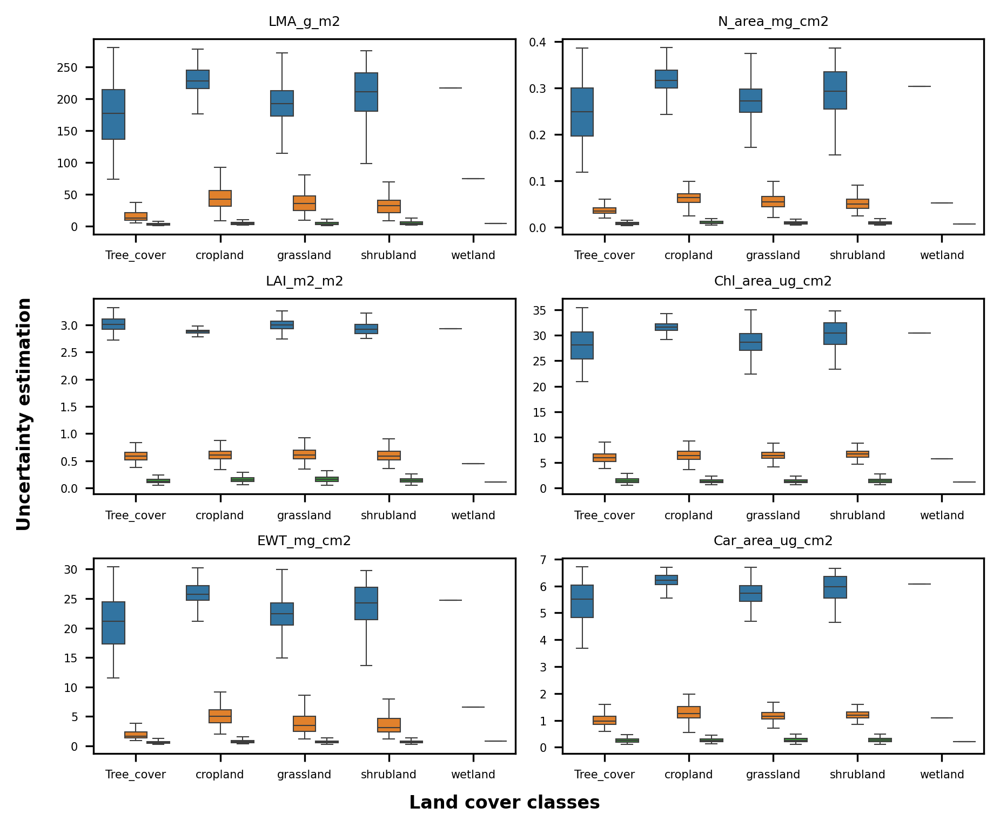

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

#### Veg

list_tr = [0, 1, 2, 4, 5, 6]

b = 2  # Number of columns
a = round(len(list_tr) / b)  # Number of rows
c = 1  # Initialize plot counter

fig = plt.figure(figsize=(6, 5), dpi=300, constrained_layout=True)
plt.rc('font', size=5)
plt.rcParams['lines.markersize'] = 0.01
plt.rcParams['lines.linewidth'] = 0.01

# # Predictions data
# ens_preds = ens_mer  # Ensure this is properly defined
# mcdrop_preds = mcdrop_mer  # Ensure this is properly defined

thre = 0.95
sample_num_per_class = 500
mult = 6

for tr in list_tr:
    ax = plt.subplot(a, b, c)
    # maxv = data_tr[ls_tr[tr]].quantile(0.95)
    # minv = data_tr[ls_tr[tr]].quantile(1-0.95)
    # nor = (maxv-minv)
    
    # Apply model
    dist_mer = apply_model(tr, path_model_tr, dis_inference, subset)#/nor
    
    # Process dist_mer
    dist_mer_tr = pd.concat([dist_mer, lc], axis=1)
    dist_mer_tr['type'] = 'dist'
    dist_mer_tr.columns = ['Norm_UN', 'lc', 'type']
    dist_mer_tr = dist_mer_tr.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    
    # Process ens_mer
    ens_mer = (1e0 * ens_preds.iloc[:, tr].reset_index(drop=True))#/nor
    ens_mer_tr = pd.concat([ens_mer, lc], axis=1)
    ens_mer_tr['type'] = 'ensemble_dl'
    ens_mer_tr.columns = ['Norm_UN', 'lc', 'type']
    ens_mer_tr = ens_mer_tr.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)

    # Process mcdrop_mer
    mcdrop_mer = (1e0 * mcdrop_preds.iloc[:, tr].reset_index(drop=True))#/nor
    mcdrop_mer_tr = pd.concat([mcdrop_mer, lc], axis=1)
    mcdrop_mer_tr['type'] = 'mc_drop'
    mcdrop_mer_tr.columns = ['Norm_UN', 'lc', 'type']
    mcdrop_mer_tr = mcdrop_mer_tr.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)

    # # Process un_true as a unique comparison case
    # un_true = pd.DataFrame(dis_err.loc[:, ls_tr[tr]].reset_index(drop=True).values, columns=['Norm_UN'])
    # un_true['lc'] = 'Veg_tr'  # Ensure a unique land cover class
    # un_true['type'] = 'Residuals_tr'  # Unique type for comparison
    # un_true = un_true.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)

    # Combine all methods, including un_true
    # test = pd.concat([dist_mer_tr, ens_mer_tr, mcdrop_mer_tr, un_true])
    test = pd.concat([dist_mer_tr, ens_mer_tr, mcdrop_mer_tr])
    test.reset_index(drop=True, inplace=True)
    test = test.dropna(subset=['Norm_UN'])

    # Extract unique labels
    labels = list(test.lc.unique())

    # Plot boxplot comparison
    sns.boxplot(
        x="lc", y="Norm_UN", hue="type", data=test,
        native_scale=True, linewidth=0.5, ax=ax,
        legend=False, showfliers=False, order=labels
    )

    plt.title('{}'.format(ls_tr[tr]))
    plt.setp(ax.collections, alpha=.4)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    c += 1  # Move to the next subplot

# Set figure labels
fig.supxlabel('Land cover classes', size=8, fontweight='bold', ha='center')
fig.supylabel('Uncertainty estimation', size=8, fontweight='bold', ha='center')


/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/echerif/miniconda3/envs/tf_env/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PowerTransformer from version 1.2.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/tmp/ipykernel_57725/2493095109.py:32: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future v

Text(0.02, 0.5, 'Uncertainty estimation')

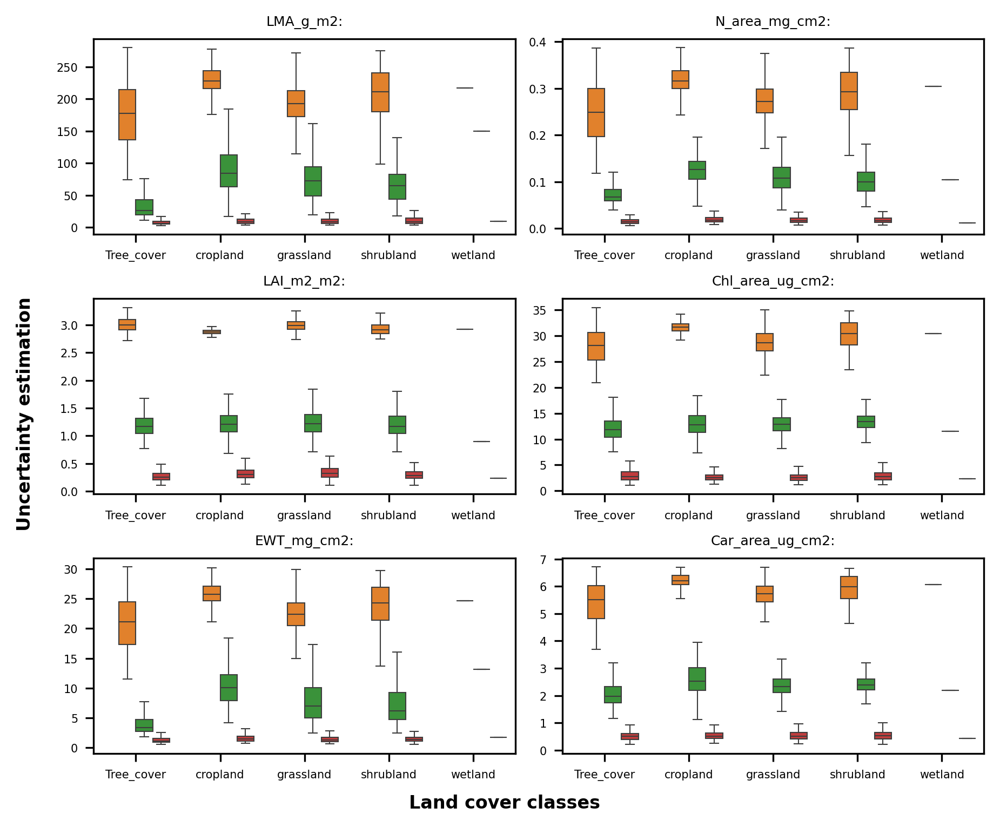

In [87]:
#### Veg

list_tr = [0,1,2,4,5,6]

b = 2  # number of columns
a = round((len(list_tr))/b) # number of rows
c = 1  # initialize plot counter

fig = plt.figure(figsize=(6, 5), dpi=300 ,constrained_layout=True)
plt.rc('font', size=5)
plt.rcParams['lines.markersize'] = 0.01
plt.rcParams['lines.linewidth'] = 0.01

jm = {}


# ens_preds = ens_mer
# mcdrop_preds = mcdrop_mer

thre = 0.95
sample_num_per_class = 500
mult = 6

for tr in list_tr:
    ax = plt.subplot(a, b, c)
    
    dist_mer =  apply_model(tr, path_model_tr, dis_inference, subset)
    
    dist_mer_tr = pd.concat([dist_mer,lc], axis=1)
    dist_mer_tr['type'] = 'dist'
    dist_mer_tr.columns = list(['Norm_UN', 'lc', 'type'])
    dist_mer_tr = dist_mer_tr.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    
    ens_mer = (2e0 * ens_preds.iloc[:,tr].reset_index(drop=True))
    ens_mer_tr = pd.concat([ens_mer ,lc], axis=1)
    ens_mer_tr['type'] = 'ensemble_dl'
    ens_mer_tr.columns = list(['Norm_UN', 'lc', 'type'])
    ens_mer_tr = ens_mer_tr.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    
    
    mcdrop_mer = (2e0 * mcdrop_preds.iloc[:,tr].reset_index(drop=True))
    mcdrop_mer_tr = pd.concat([mcdrop_mer ,lc], axis=1)
    mcdrop_mer_tr['type'] = 'mc_drop'
    mcdrop_mer_tr.columns = list(['Norm_UN', 'lc', 'type'])
    mcdrop_mer_tr = mcdrop_mer_tr.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)

    un_true = pd.DataFrame(dis_err.loc[:,ls_tr[tr]].reset_index(drop=True).values)
    un_true['lc'] = 'Veg_tr'
    un_true['type'] = 'Residuals_tr'
    un_true.columns=list(['Norm_UN', 'lc', 'type'])
    un_true = un_true.groupby(['lc']).apply(lambda x: x.sample(n=sample_num_per_class, random_state=42, replace=True)).reset_index(drop=True)
    
    
    # test = pd.concat([dist_mer_tr, ens_mer_tr, mcdrop_mer_tr])
    test = pd.concat([un_true, dist_mer_tr, ens_mer_tr, mcdrop_mer_tr])
    test.reset_index(drop=True, inplace=True)
    test = test.dropna(subset=['Norm_UN'])
    # test.columns = list(['Norm_UN', 'lc', 'type'])

    jm = {}
    # labels = ['Tree_cover', 'cropland', 'grassland', 'shrubland', 'wetland', 'Veg_tr'] #['Veg', 'Shadow', 'Water'] #['Veg', 'Urban', 'Water', 'Shadow', 'Cloud'] #list(test_m.lc.unique())
    
    for m in test.type.unique():
        test_m = test.groupby(['type']).get_group(m)
        # labels = list(test_m.lc.unique())
        labels = list(test_m.lc.unique())     #['Veg', 'Shadow', 'Water'] #['Veg', 'Urban', 'Water', 'Shadow', 'Cloud'] #list(test_m.lc.unique())   
        
        veg_un = [test_m.groupby(['lc']).get_group(lc)['Norm_UN'] for lc in labels] #labels[3:]
        veg_un = pd.concat(veg_un).dropna()
        
    sns.boxplot(x="lc", y='Norm_UN', hue="type", data=test, native_scale=True, linewidth=0.5,  ax=ax, legend=False, showfliers=False, order=labels) #, inner="quartile" point None,
         
    plt.title('{}:'.format(ls_tr[tr]))     
    plt.setp(ax.collections, alpha=.4)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    c = c + 1

fig.supxlabel('Land cover classes', size=8, fontweight='bold', ha='center')
fig.supylabel('Uncertainty estimation', size=8, fontweight='bold', ha='center')
